# Preprocessing (2/6)

In this notebook, we will test various image preprocessing techniques and compare the resulting images with the original ones. We will then perform a gridsearch with some basic models to compare the impact of various combinations of preprocessing techniques on the F1Score, this will give us an idea of the best preprocessing parameters to use going forward.

## Imports

The imports section contains the code used to import the dataset, as well as the transformations required to encode the target columns into the needed format.

In [1]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

#model selection
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import ParameterGrid

#dl libraraies
import tensorflow as tf
from tensorflow.keras.models import Sequential

from keras.layers import Dense
from keras.utils import to_categorical, load_img

# specifically for cnn
from keras.layers import Flatten, Conv2D, MaxPooling2D

# specifically for manipulating zipped images and getting numpy arrays of pixel values of images.
import cv2
from tqdm import tqdm
from PIL import ImageOps, Image
from IPython.display import clear_output
%load_ext autoreload
%autoreload 2
from utils.tools import preprocess_img

In [2]:
%cd ..

data = pd.read_csv("image_data_clean.csv")
data.head()

c:\Users\luisb\OneDrive\Documentos\uni\Year 3\Semester 1\Deep learning\project\Group_1


,path_to_image,Benign or Malignant,Cancer Type,Image_folder,Magnification
0,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,adenosis,SOB_B_A_14-22549AB,100X
1,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,adenosis,SOB_B_A_14-22549AB,100X
2,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,adenosis,SOB_B_A_14-22549AB,100X
3,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,adenosis,SOB_B_A_14-22549AB,100X
4,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,adenosis,SOB_B_A_14-22549AB,100X


In [3]:
y_labels_MC = data['Cancer Type']
y_labels_Bi = data['Benign or Malignant']
paths = data['path_to_image']

In [4]:
label_encoder_multiclass = LabelEncoder()
y_multiclass = label_encoder_multiclass.fit_transform(y_labels_MC)
y_multiclass = to_categorical(y_multiclass,8)

In [5]:
label_encoder_binary = LabelEncoder() # use .inverse_transform(array) to optaing the labels at the end
y_binary = label_encoder_binary.fit_transform(y_labels_Bi)
y_binary = to_categorical(y_binary,2)

In [6]:
y_multiclass

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [7]:
y_binary


array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [8]:
%cd ..

c:\Users\luisb\OneDrive\Documentos\uni\Year 3\Semester 1\Deep learning\project


## Preprocessing

In this section, we split our data into train and test sets, we will then split our train set into train_hp and val_hp, where the hp stands for hold-out partition. The train set will be used for cross-validation to verify results and the hp sets will be used for normal testing. We will also calculate the dictionary of weights for the classes, for both the binary and multiclass labels. 

In [9]:
X_train, X_test, y_multiclass_train, y_multiclass_test  = train_test_split(paths, 
                                                                           y_multiclass, 
                                                                           test_size=0.2, 
                                                                           random_state=42,
                                                                           stratify=y_multiclass,
                                                                           shuffle=True)

In [10]:
X_train_hp, X_val_hp, y_multiclass_train_hp, y_multiclass_val_hp  = train_test_split(X_train, 
                                                                                     y_multiclass_train, 
                                                                                     test_size=0.2, 
                                                                                     random_state=42,
                                                                                     stratify=y_multiclass_train,
                                                                                     shuffle=True)

In [11]:
X_train, X_test, y_binary_train, y_binary_test  = train_test_split(paths, 
                                                                   y_binary, 
                                                                   test_size=0.2, 
                                                                   random_state=42,
                                                                   stratify=y_binary,
                                                                   shuffle=True)

In [12]:
X_train_hp, X_val_hp, y_binary_train_hp, y_binary_val_hp  = train_test_split(X_train, 
                                                                             y_binary_train, 
                                                                             test_size=0.2, 
                                                                             random_state=42,
                                                                             stratify=y_binary_train,
                                                                             shuffle=True)

In [13]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_labels_MC), y=y_labels_MC)
class_weights_dict_MC = {key:val for key, val in zip(label_encoder_multiclass.transform(np.unique(y_labels_MC)),class_weights)}
class_weights_dict_MC

{np.int64(0): np.float64(2.2266328828828827),
 np.int64(1): np.float64(0.2864749348015068),
 np.int64(2): np.float64(0.9749753451676528),
 np.int64(3): np.float64(1.579273162939297),
 np.int64(4): np.float64(1.2482638888888888),
 np.int64(5): np.float64(1.7654017857142856),
 np.int64(6): np.float64(2.1823951434878586),
 np.int64(7): np.float64(1.7374780316344465)}

In [14]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_labels_Bi), y=y_labels_Bi)
class_weights_dict_Bi = {key:val for key, val in zip(label_encoder_binary.transform(np.unique(y_labels_Bi)),class_weights)}
class_weights_dict_Bi

{np.int64(0): np.float64(1.5945564516129032),
 np.int64(1): np.float64(0.7284030208141462)}

## Testing


Now, we will test some preprocessing techniques that we believe could be beneficial and see their impact on our images. For that purpose, we will get the the first image for each Cancer Type, so we can check the impact of changes on all of our classes.

In [15]:
group = data.groupby(['Cancer Type']).first().reset_index()
group

,Cancer Type,path_to_image,Benign or Malignant,Image_folder,Magnification
0,adenosis,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_A_14-22549AB,100X
1,ductal_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_DC_14-10926,100X
2,fibroadenoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_F_14-14134,100X
3,lobular_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_LC_14-12204,100X
4,mucinous_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_MC_14-10147,100X
5,papillary_carcinoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,malignant,SOB_M_PC_14-12465,100X
6,phyllodes_tumor,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_PT_14-21998AB,100X
7,tubular_adenoma,./DeepLearning24_25/BreaKHis_v1 2/histology_sl...,benign,SOB_B_TA_14-13200,100X


### PIL autocontrast

The first method we will try is autocontrast from the ImageOps module of PIL. This method maximizes or normalizes image contrast. A detailed description of the transformations this method performs can be found at <a href="https://pillow-wiredfool.readthedocs.io/en/latest/reference/ImageOps.html"> PIL ImageOps module </a>.  

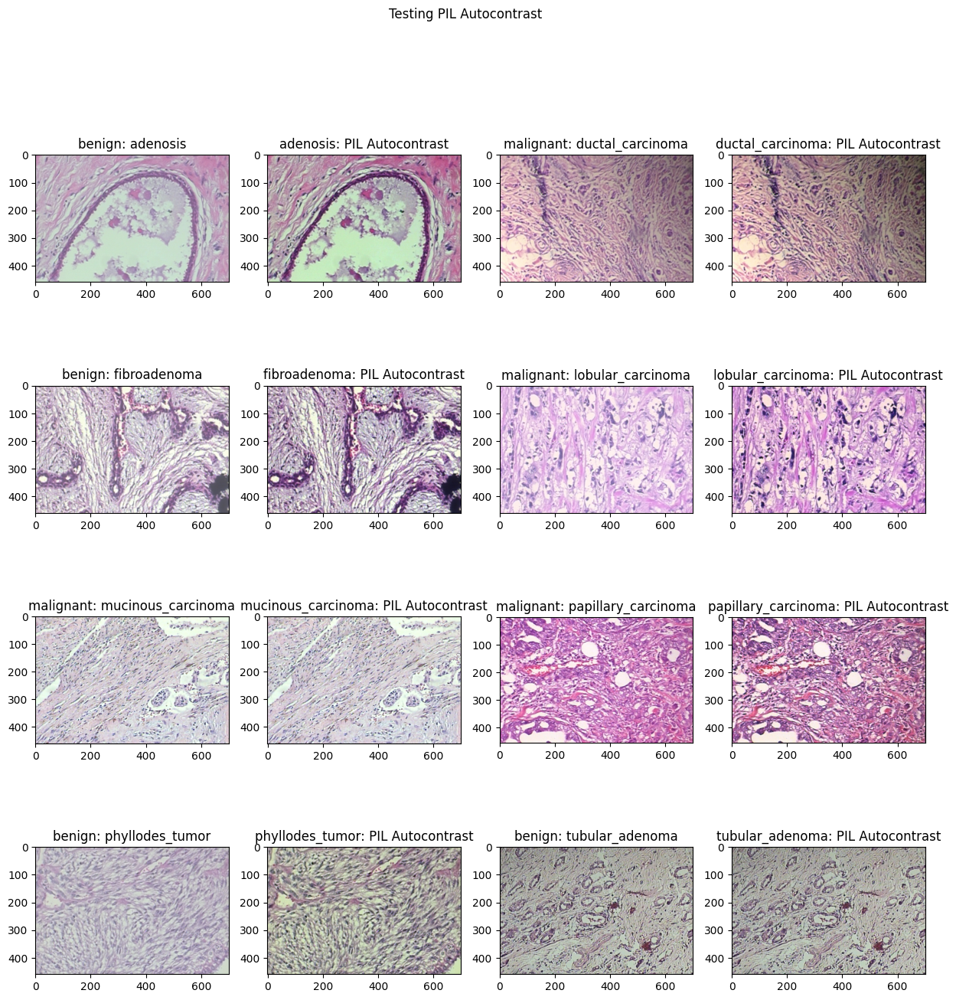

In [16]:
fig, ax = plt.subplots(4,4, figsize=(15, 15))
fig.suptitle('Testing PIL Autocontrast')
ax = ax.flatten()
index = 0
for i, img in group.iterrows():

    img_l = load_img(img.path_to_image)
    ax[index].imshow(img_l)
    ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
    index+=1
    img_cont = ImageOps.autocontrast(img_l)
    ax[index].imshow(img_cont)
    ax[index].set_title(f'{img['Cancer Type']}: PIL Autocontrast')
    index+=1
    
plt.show()

From the images, we can see that this method seem to highlight some of the smaller details in the images, but in some cases it also leads to some loss of color in the images. We will test it in the gridsearch later on.

### CV2 Contrast and brightness  

The next test we will perform will involve testing the extremes of the alpha (contrast) and beta (brightness) values on the convertScaleAbs method from CV2 to see the impact of contrast and brightness transformations on our images. A more detailed explanation of the method can be found at <a href="https://docs.opencv.org/4.x/d3/dc1/tutorial_basic_linear_transform.html"> Changing the contrast and brightness of an image in CV2! </a>

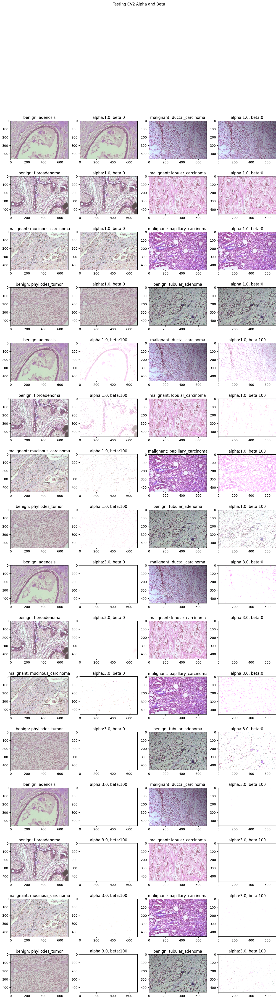

In [ ]:
fig, ax = plt.subplots(16,4, figsize=(15, 50))
fig.suptitle('Testing CV2 Alpha and Beta')
ax = ax.flatten()
index = 0

for alpha in [1.0, 3.0]:
    for beta in [0,100]:
        for i, img in group.iterrows():
            img_l = cv2.imread(img.path_to_image)
            ax[index].imshow(img_l)
            ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
            index+=1
            img_cont = cv2.convertScaleAbs(img_l, alpha=alpha, beta=beta)
            ax[index].imshow(img_cont)
            ax[index].set_title(f'alpha:{alpha}, beta:{beta}')
            index+=1
plt.show()

From the images above, we can clearly see that extremely high values of contrast or brightness essentialy remove all of the image. This will be taken into account when selecting values for the gridsearch later on.

### CV2 K-Means

We will now test image segmentation to see if a K-Means segmentation from CV2 provides any additional value to our images. Information on the details of the K-Means implementaton from CV2 can be found at <a href='https://docs.opencv.org/4.x/d1/d5c/tutorial_py_kmeans_opencv.html'> K-Means Clustering in OpenCV </a>.

In [18]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 3
attempts=10

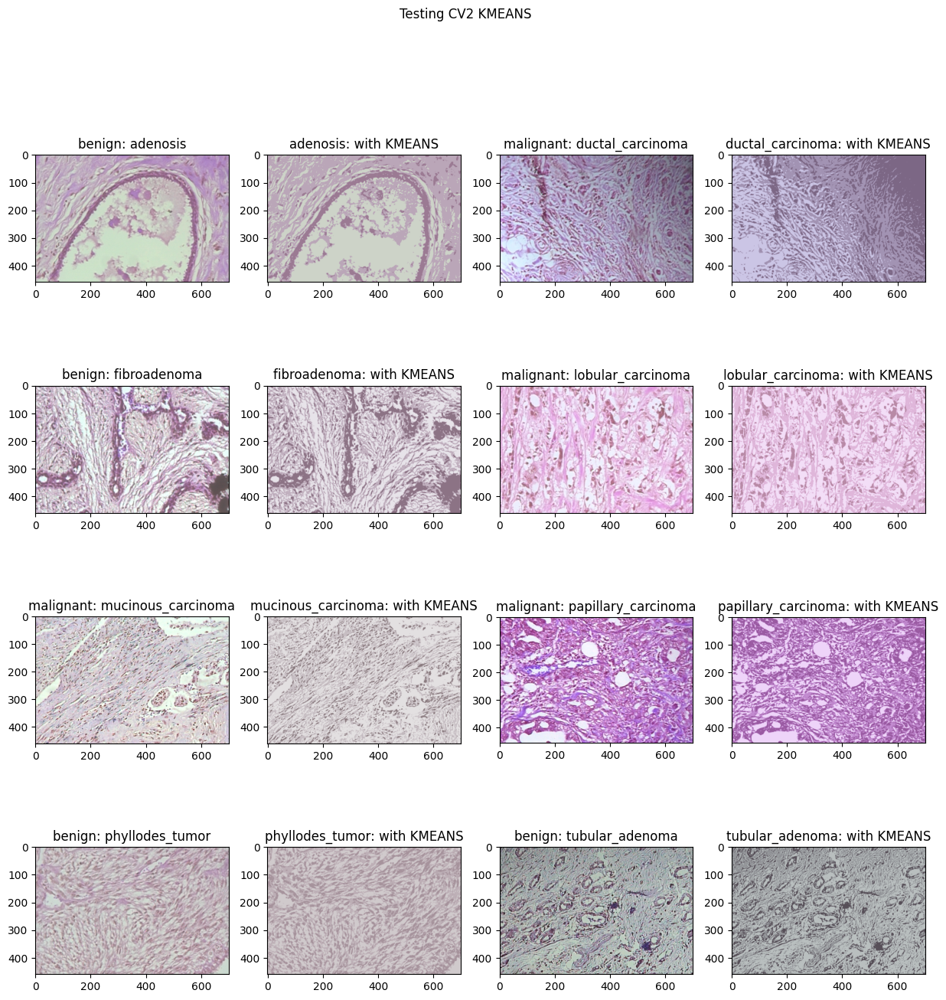

In [19]:
fig, ax = plt.subplots(4,4, figsize=(15, 15))
fig.suptitle('Testing CV2 KMEANS')
ax = ax.flatten()
index = 0

for i, img in group.iterrows():
            img_l = cv2.imread(img.path_to_image)
            ax[index].imshow(img_l)
            ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
            index +=1
            twoDimage = img_l.reshape((-1,3))
            twoDimage = np.float32(twoDimage)
            ret,label,center=cv2.kmeans(twoDimage,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
            center = np.uint8(center)
            res = center[label.flatten()]
            result_image = res.reshape((img_l.shape))
            ax[index].imshow(result_image)
            ax[index].set_title(f'{img['Cancer Type']}: with KMEANS')
            index +=1
            
plt.show()

After testing various values of K and looking at the images, in our opinion this method does not yield interesting results as the details, such as color differentiation,  of the images are lost. We will not be using this method going forward.

### CV2 Noise Removal

Despite the fact that in our opinion, our images don't contain a relevant amount noise, we will test the Noise Removal using methods from CV2. Information on the methods as well as their implementation can be found at <a href="https://docs.opencv.org/4.x/d5/d69/tutorial_py_non_local_means.html"> Image Denoising in CV2 </a>.

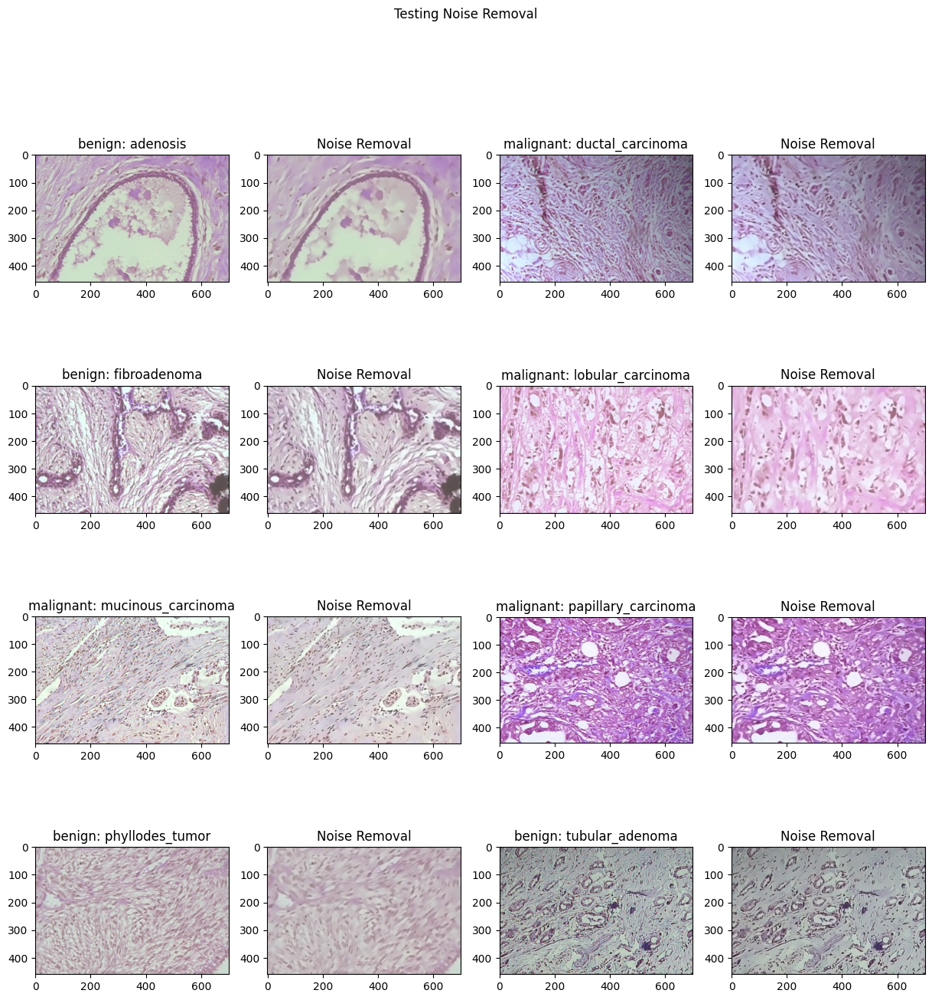

In [20]:
fig, ax = plt.subplots(4,4, figsize=(15, 15))
fig.suptitle('Testing Noise Removal')
ax = ax.flatten()
index = 0

for i, img in group.iterrows():
            img_l = cv2.imread(img.path_to_image)
            ax[index].imshow(img_l)
            ax[index].set_title(f'{img['Benign or Malignant']}: {img['Cancer Type']}')
            index += 1
            img=cv2.fastNlMeansDenoisingColored(img_l, None, 10, 10, 7, 21)
            ax[index].imshow(img)
            ax[index].set_title(f'Noise Removal')
            index += 1
plt.show()

As we said previously, it seems that our images don't have a lot of noise. Applying a noise reduction technique only removes detail and smoothens the images. We will not use this method going forward.

# Gridsearch

We will now perform the gridsearch described at the begginning of this notebook, with the different image processing methods we found to be valuable in the Testing section. We will only test resizing images to 150x150, because from some testing it was clear that going up to even 200x200 would massively increase model run times and going to 100x100 would lead to worse results.

In [21]:
tf.random.set_seed(23)

In [ ]:
param_grid = {'img_size' : [[150, '150x150']],
          'resize' : [True],
          'interpolation': [cv2.INTER_CUBIC],
          'normalization': [True],
          'color':[[None, 'Original'], [cv2.COLOR_RGB2GRAY, 'Gray']],
          'alpha':[1.0, 2.0],
          'beta': [0, 50],
          'pil_autocontrast': [True, False]}

best_params_Bi = None
best_F1_Bi = 0
best_params_MC = None
best_F1_MC = 0

grid = ParameterGrid(param_grid)
i = 0

for params in tqdm(grid):
    i += 1
    print(f'\nBest Binary val_F1Score so far: {best_F1_Bi}. Parameters: {best_params_Bi}\n')
    print(f'Best Multiclass val_F1Score so far: {best_F1_MC}. Parameters: {best_params_MC}\n')
    print(f'\nTesting: {params}\n')
    X_train_hp_a = preprocess_img(X_train_hp, width=params['img_size'][0], 
                    height=params['img_size'][0],
                    resize= params['resize'], 
                    interpolation= params['interpolation'], 
                    normalization= params['normalization'],
                    color=params['color'][0],
                    alpha=params['alpha'],
                    beta=params['beta'],
                    pil_autocontrast=params['pil_autocontrast'])
    X_val_hp_a = preprocess_img(X_val_hp, width=params['img_size'][0], 
                    height=params['img_size'][0],
                    resize= params['resize'], 
                    interpolation= params['interpolation'], 
                    normalization= params['normalization'],
                    color=params['color'][0],
                    alpha=params['alpha'],
                    beta=params['beta'],
                    pil_autocontrast=params['pil_autocontrast'])
    
    shape_input = X_train_hp_a.shape[1:]

    if len(shape_input) < 3:
        X_train_hp_a = X_train_hp_a.reshape(-1,150,150,1)
        X_val_hp_a = X_val_hp_a.reshape(-1,150,150,1)
    shape_input = X_train_hp_a.shape[1:]

    # Binary Model
    print('\nBinary Model:')
    model_Bi= Sequential()
    model_Bi.add(Conv2D(32, (3, 3), activation='relu', input_shape=shape_input))
    model_Bi.add(Conv2D(32, (3, 3), activation='relu'))
    model_Bi.add(MaxPooling2D((3,3)))
    model_Bi.add(Conv2D(32, (3, 3), activation='relu'))
    model_Bi.add(Conv2D(32, (3, 3), activation='relu'))
    model_Bi.add(MaxPooling2D((2,2)))
    model_Bi.add(Flatten())
    model_Bi.add(Dense(512, activation='relu'))
    model_Bi.add(Dense(2, activation='softmax'))

    model_Bi.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['F1Score'])

    history_Bi=model_Bi.fit(X_train_hp_a, y_binary_train_hp, batch_size= 100, epochs=7, 
                            validation_data=[X_val_hp_a, y_binary_val_hp], class_weight=class_weights_dict_Bi)         
    Bi_model_F1 = np.max(np.mean(history_Bi.history['val_F1Score'], axis=1))
    if Bi_model_F1 > best_F1_Bi:
        best_F1_Bi = Bi_model_F1
        best_params_Bi = params
    
    # Multiclass model
    print('\nMulticlass Model:')
    model_MC = Sequential()
    model_MC.add(Conv2D(32, (3, 3), activation='relu', input_shape=shape_input))
    model_MC.add(Conv2D(32, (3, 3), activation='relu'))
    model_MC.add(Conv2D(32, (3, 3), activation='relu'))
    model_MC.add(MaxPooling2D((3,3)))
    model_MC.add(Conv2D(32, (3, 3), activation='relu'))
    model_MC.add(Conv2D(32, (3, 3), activation='relu'))
    model_MC.add(MaxPooling2D((2,2)))
    model_MC.add(Flatten())
    model_MC.add(Dense(1024, activation='relu'))
    model_MC.add(Dense(8, activation='softmax'))

    model_MC.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['F1Score'])

    history_MC=model_MC.fit(X_train_hp_a, y_multiclass_train_hp, batch_size= 100, epochs=7, 
                            validation_data=[X_val_hp_a, y_multiclass_val_hp], class_weight=class_weights_dict_MC)           
    MC_model_F1 = np.max(np.mean(history_MC.history['val_F1Score'], axis=1))
    if MC_model_F1 > best_F1_MC:
        best_F1_MC = MC_model_F1
        best_params_MC = params

    del X_train_hp_a, X_val_hp_a
    clear_output()

100%|██████████| 16/16 [4:21:30<00:00, 980.66s/it]


In [ ]:
print('Binary Model')
print(f'Best F1 score in validation: {best_F1_Bi}')
print(f'Best parameters: {best_params_Bi}')

Binary Model
Best F1 score in validation: 0.812681257724762
Best parameters: {'alpha': 1.0, 'beta': 0, 'color': [None, 'Original'], 'img_size': [150, '150x150'], 'interpolation': 2, 'normalization': True, 'pil_autocontrast': False, 'resize': True}


Best combination of parameters for Binary: 'alpha': 1.0, 'beta': 0, 'color': [None, 'Original'], 'img_size': [150, '150x150'], 'interpolation': 2, 'normalization': True, 'pil_autocontrast': False, 'resize': True

This combination of parameters is essentially only resizing the images and not actually performing any transformations.

In [ ]:
print('Multiclass Model')
print(f'Best F1 score in validation: {best_F1_MC}')
print(f'Best parameters: {best_params_MC}')

Multiclass Model
Best F1 score in validation: 0.06582791358232498
Best parameters: {'alpha': 1.0, 'beta': 50, 'color': [None, 'Original'], 'img_size': [150, '150x150'], 'interpolation': 2, 'normalization': True, 'pil_autocontrast': True, 'resize': True}


Best combination of parameters for Multiclass: 'alpha': 1.0, 'beta': 50, 'color': [None, 'Original'], 'img_size': [150, '150x150'], 'interpolation': 2, 'normalization': True, 'pil_autocontrast': True, 'resize': True

Going forward we will use the best combination we obtained for our binary model for both binary and multiclass models (work with the original images resized for now). This is because the results for the multiclass test were very low, making it essentially impossible to extract meaningful comparisons from them.

## Pixel value distribution

Now that we have our preprocessing methods defined, we will check the distribution of pixel values across our images.


In [9]:
Bi_analysis = preprocess_img(paths, width=150, 
                   height=150,
                   resize=True , 
                   interpolation=cv2.INTER_CUBIC, 
                   normalization=True,
                   color=None,
                   alpha=1,
                   beta=0,
                   pil_autocontrast=False)

100%|██████████| 7909/7909 [01:37<00:00, 81.31it/s]


In [10]:
mean_chanel = []
mean_overal = []
median_chanel = []
median_overal = []

for image in tqdm(Bi_analysis):
    
    mean_overal.append(np.mean(image))
    median_overal.append(np.median(image))
    mean_chanel.append(np.mean(image, axis= tuple(range(image.ndim-1))))
    median_chanel.append(np.median(image, axis= tuple(range(image.ndim-1))))

mean_overal = np.array(mean_overal)
median_overal = np.array(median_overal)
mean_chanel = np.array(mean_chanel)
median_chanel = np.array(median_chanel)

100%|██████████| 7909/7909 [00:13<00:00, 576.08it/s]


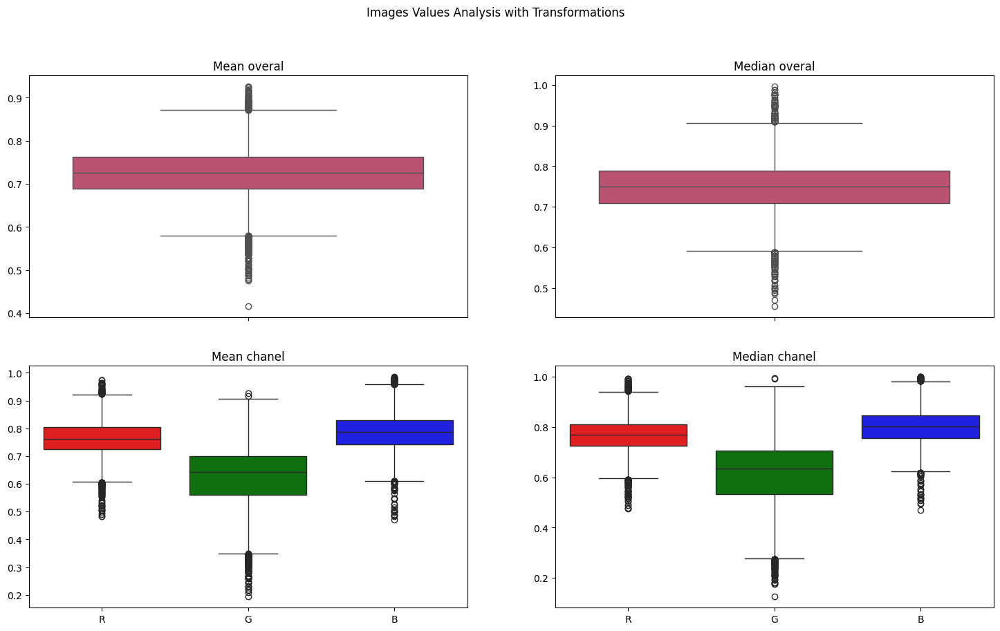

In [11]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('Images Values Analysis with Transformations')
sns.boxplot(data=mean_overal, ax = axes[0,0], palette=["#cb416b"])
axes[0,0].set_title('Mean overal')
sns.boxplot(data=median_overal, ax = axes[0,1], palette=["#cb416b"])
axes[0,1].set_title('Median overal')
sns.boxplot(data=mean_chanel, ax = axes[1,0], palette=["red","green","blue"])
axes[1,0].set_title('Mean chanel')
axes[1,0].set_xticklabels(['R','G','B'])

sns.boxplot(data=median_chanel,  ax = axes[1,1], palette=["red","green","blue"])
axes[1,1].set_title('Median chanel')
axes[1,1].set_xticklabels(['R','G','B'])

plt.show()

We can see that there are some outliers for all 3 channels in our images. We won't perform any further changes, as we believe that "normalizing" these outliers would not be valuable. Also we see that the resizing doesn’t change the distribution of the pixels that much.

## Data

We will now export all of our preprocessed data into pickle files, including the label encoders we have used, the labels of our data, train and test sets, where train is used for cross-validation to validate results and also train_hp and val_hp sets which will be used for model testing, as testing all models through cross-validation would far too time consuming. 

As we are performing new splits we will have to once again perform image preprocessing.

### Spliting the data to use in the models

We will perform a new split, this time stratifying by class and magnification level, since the magnification in each class is not equal and to guarantee that the train has samples of each magnification scale.

In [11]:
y_magnitude_labels = data['Magnification']

label_encoder_magnification = LabelEncoder()
y_magnitude = label_encoder_magnification.fit_transform(y_magnitude_labels)
y_magnitude = to_categorical(y_magnitude,4)

y_magnitude[:5]

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.]])

In [12]:
y_multiclass[:5]

array([[1., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0.]])

In [13]:
y_binary[:5]

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [14]:
class_mag = data.apply(lambda row: row['Cancer Type']+"_"+row['Magnification'], axis=1)
class_mag

0                 adenosis_100X
1                 adenosis_100X
2                 adenosis_100X
3                 adenosis_100X
4                 adenosis_100X
                 ...           
7904    papillary_carcinoma_40X
7905    papillary_carcinoma_40X
7906    papillary_carcinoma_40X
7907    papillary_carcinoma_40X
7908    papillary_carcinoma_40X
Length: 7909, dtype: object

In [15]:
X_train, X_test, y_binary_train, y_binary_test, \
    y_multiclass_train, y_multiclass_test, Mag_train, \
        Mag_test, stratify_train, _ = train_test_split(paths, 
                                                        y_binary, 
                                                        y_multiclass,
                                                        y_magnitude,
                                                        class_mag,
                                                        test_size=0.2, 
                                                        random_state=42,
                                                        stratify=class_mag,
                                                        shuffle=True)

In [16]:
X_train_hp, X_val_hp, y_binary_train_hp, y_binary_val_hp,\
      y_multiclass_train_hp, y_multiclass_val_hp, Mag_train_hp,\
          Mag_val_hp  = train_test_split(X_train, 
                                        y_binary_train,
                                        y_multiclass_train,
                                        Mag_train,
                                        test_size=0.2, 
                                        random_state=42,
                                        stratify=stratify_train,
                                        shuffle=True)

### Label Encoder

In [17]:
with open('./Group_1/Data_Images/LabelEncoder_Bi_MC.pkl', 'wb') as file:  
    pickle.dump([label_encoder_binary, label_encoder_multiclass] , file)

### Y Labels

In [18]:
with open('./Group_1/Data_Images/Ylabels_Bi_MC.pkl', 'wb') as file:  
    pickle.dump([y_labels_Bi, y_labels_MC] , file)

### Hold-Out Method

In [19]:
X_train_hp_a = preprocess_img(X_train_hp, width=150, 
                   height=150,
                   resize=True , 
                   interpolation=cv2.INTER_CUBIC, 
                   normalization=True,
                   color=None,
                   alpha=1,
                   beta=0,
                   pil_autocontrast=False)

# Saving the images to a pickle file
with open('./Group_1/Data_Images/Train_HP_img_yEncode_Bi_MC_Mag.pkl', 'wb') as file:  
    pickle.dump([X_train_hp_a, y_binary_train_hp, y_multiclass_train_hp, Mag_train_hp], file)

del X_train_hp_a

X_val_hp_a = preprocess_img(X_val_hp, width=150, 
                   height=150,
                   resize=True , 
                   interpolation=cv2.INTER_CUBIC, 
                   normalization=True,
                   color=None,
                   alpha=1,
                   beta=0,
                   pil_autocontrast=False)

# Saving the images to a pickle file
with open('./Group_1/Data_Images/Val_HP_img_yEncode_Bi_MC_Mag.pkl', 'wb') as file:  
    pickle.dump([X_val_hp_a, y_binary_val_hp, y_multiclass_val_hp, Mag_val_hp], file)

del X_val_hp_a

100%|██████████| 1266/1266 [00:14<00:00, 88.71it/s]


### Cross Validation

In [20]:
X_train_a = preprocess_img(X_train, width=150, 
                   height=150,
                   resize=True , 
                   interpolation=cv2.INTER_CUBIC, 
                   normalization=True,
                   color=None,
                   alpha=1,
                   beta=0,
                   pil_autocontrast=False)

# Saving the images to a pickle file
with open('./Group_1/Data_Images/Train_img_yEncode_Bi_MC_Mag.pkl', 'wb') as file:  
    pickle.dump([X_train_a, y_binary_train, y_multiclass_train, Mag_train], file)

del X_train_a

100%|██████████| 6327/6327 [01:05<00:00, 96.08it/s] 


### Test Data

In [21]:
X_test_a = preprocess_img(X_test, width=150, 
                   height=150,
                   resize=True , 
                   interpolation=cv2.INTER_CUBIC, 
                   normalization=True,
                   color=None,
                   alpha=1,
                   beta=0,
                   pil_autocontrast=False)

# Saving the images to a pickle file
with open('./Group_1/Data_Images/Test_img_yEncode_Bi_MC_Mag.pkl', 'wb') as file:  
    pickle.dump([X_test_a, y_binary_test, y_multiclass_test, Mag_test], file)

del X_test_a

100%|██████████| 1582/1582 [00:18<00:00, 86.12it/s]


## Next Step
Go to the Benchmark notebook to see the minimum aceptable solution that we will consider.